<a href="https://colab.research.google.com/github/via-zhang/data-workshops/blob/main/docs/intro_fire_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro to Geospatial Analysis: Fires

Welcome to this workshop!
We will analyze fires in California, create charts and interactive maps, and visualize fire impacts with satellite imagery.

Everything will be done in this Google Colab file. We will be coding in the Python programming language, which is commonly used by data scientists and researchers in various fields.

**To run the code:**
> Make sure you have this notebook open in Google Colab (if you are starting from the digital textbook, click on the {fa}`rocket` icon to the top right and click **Colab**). Each block of code is called a cell. To run a cell, hover over it and click the arrow in the top left of the cell, or click inside of the cell and press Shift + Enter.

Note: When you run a block of code for the first time, Google Colab will say `Warning: This notebook was not authored by Google`. Please click `Run Anyway`.

Data Sources:
- [California Department of Forestry and Fire Protection (CAL FIRE)](https://www.fire.ca.gov/incidents)
- [Sentinel-2 Satellite Imagery hosted by Planetary Computer](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a)

This workshop was presented at the 2025 [Student Sustainability Summit](https://www.studentsustainabilitysummit.org/)

## Part 1: California Fires

### Load & Format Data

In [ ]:
# Import packages

# General
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from datetime import timedelta

# Mapping
import geopandas as gpd
import folium
from shapely.geometry import Point
import matplotlib.pyplot as plt
from shapely.geometry import Point
!pip install contextily
import contextily as cx
!pip install mapclassify
import mapclassify

# Satellite
!pip install pystac-client
!pip install planetary_computer

from pystac.extensions.eo import EOExtension as eo
import pystac_client
import planetary_computer
from shapely import wkt
import rasterio
from rasterio import windows
from rasterio import features
from rasterio import warp

In [2]:
# Load CAL FIRE dataset directly from the link - no download needed!
data = pd.read_csv('https://incidents.fire.ca.gov/imapdata/mapdataall.csv')

# View the first 5 rows of the data
data.head()

,incident_name,incident_is_final,incident_date_last_update,incident_date_created,incident_administrative_unit,incident_administrative_unit_url,incident_county,incident_location,incident_acres_burned,incident_containment,...,incident_latitude,incident_type,incident_id,incident_url,incident_date_extinguished,incident_dateonly_extinguished,incident_dateonly_created,is_active,calfire_incident,notification_desired
0,Bridge Fire,Y,2018-01-09T13:46:00Z,2017-10-31T11:22:00Z,Shasta-Trinity National Forest,NaN,Shasta,"I-5 and Turntable Bay, 7 miles NE of Shasta Lake",37.0,100.0,...,40.774000,NaN,2ca11d45-8139-4c16-8af0-880d99b21e82,https://www.fire.ca.gov/incidents/2017/10/31/b...,2018-01-09T13:46:00Z,2018-01-09,2017-10-31,N,False,False
1,Pala Fire,Y,2020-09-16T14:07:35Z,2009-05-24T14:56:00Z,CAL FIRE San Diego Unit,NaN,San Diego,"Hwy 76 and Pala Temecula, northwest of Pala",122.0,100.0,...,1.000000,Wildfire,8f61f461-552d-4538-b186-35ab030da416,https://www.fire.ca.gov/incidents/2009/5/24/pa...,2009-05-25T00:00:00Z,2009-05-25,2009-05-24,N,True,False
2,River Fire,Y,2022-10-24T11:39:23Z,2013-02-24T08:16:00Z,CAL FIRE San Bernardino Unit,NaN,Inyo,"south of Narrow Gauge Rd & north of Hwy 136, e...",407.0,100.0,...,36.602575,NaN,094719ba-a47b-4abb-9ec5-a506b2b9fd23,https://www.fire.ca.gov/incidents/2013/2/24/ri...,2013-02-28T20:00:00Z,2013-02-28,2013-02-24,N,True,False
3,Fawnskin Fire,Y,2013-04-22T09:00:00Z,2013-04-20T17:30:00Z,San Bernardino National Forest,NaN,San Bernardino,"west of Delamar Mountain, north of the communi...",30.0,100.0,...,34.288877,NaN,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f,https://www.fire.ca.gov/incidents/2013/4/20/fa...,2013-04-22T09:00:00Z,2013-04-22,2013-04-20,N,False,False
4,Gold Fire,Y,2013-05-01T07:00:00Z,2013-04-30T12:59:00Z,CAL FIRE Madera-Mariposa-Merced Unit,NaN,Madera,Between Road 210 and Road 200 near Fine Gold C...,274.0,100.0,...,37.116295,NaN,357ffc13-bef9-48eb-810f-c5de851972eb,https://www.fire.ca.gov/incidents/2013/4/30/go...,2013-05-01T07:00:00Z,2013-05-01,2013-04-30,N,True,False


In [3]:
# Display information about the columns - see what data we have to work with!
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2839 entries, 0 to 2838
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   incident_name                     2839 non-null   object 
 1   incident_is_final                 2839 non-null   object 
 2   incident_date_last_update         2839 non-null   object 
 3   incident_date_created             2839 non-null   object 
 4   incident_administrative_unit      2783 non-null   object 
 5   incident_administrative_unit_url  0 non-null      float64
 6   incident_county                   2829 non-null   object 
 7   incident_location                 2839 non-null   object 
 8   incident_acres_burned             2786 non-null   float64
 9   incident_containment              2783 non-null   float64
 10  incident_control                  117 non-null    object 
 11  incident_cooperating_agencies     1660 non-null   object 
 12  incide

In [4]:
# Format the date columns (before, they were stored as 'object' types instead of dates)
data['incident_date_extinguished'] = pd.to_datetime(data['incident_date_extinguished'])
data['incident_dateonly_extinguished'] = pd.to_datetime(data['incident_dateonly_extinguished'])
data['incident_date_created'] = pd.to_datetime(data['incident_date_created'])
data['incident_dateonly_created'] = pd.to_datetime(data['incident_dateonly_created'])

# Make a new column of the year (not the full date)
data['year'] = data['incident_dateonly_created'].dt.year

In [5]:
# Filter the longitude and latitude to California (these coordinates were estimated based on Google Maps)
data = data[(data['incident_latitude'] > 32) &
            (data['incident_latitude'] < 42) &
            (data['incident_longitude'] > -124) &
            (data['incident_longitude'] < -114)]

# Convert this dataset to a GeoDataFrame, which stores information about the location of the points to make them easier to plot on a map
data = gpd.GeoDataFrame(data, geometry = gpd.points_from_xy(data['incident_longitude'], data['incident_latitude']), crs = 'EPSG:4326')

# Sort fire dataset by acres burned (in ascending order)
data = data.sort_values(by='incident_acres_burned', ascending=True)

In [6]:
# View the first 5 rows of the data
data.head()

,incident_name,incident_is_final,incident_date_last_update,incident_date_created,incident_administrative_unit,incident_administrative_unit_url,incident_county,incident_location,incident_acres_burned,incident_containment,...,incident_id,incident_url,incident_date_extinguished,incident_dateonly_extinguished,incident_dateonly_created,is_active,calfire_incident,notification_desired,year,geometry
320,Gorman Fire,Y,2016-04-19T15:30:00Z,2016-04-19 13:09:00+00:00,Los Angeles County Fire,NaN,Los Angeles,off northbound Interstate 5 at Gorman Creek,0.0,100.0,...,2c77fa07-73e6-45fe-a527-5bd526bdef41,https://www.fire.ca.gov/incidents/2016/4/19/go...,2016-04-19 15:30:00+00:00,2016-04-19,2016-04-19,N,False,False,2016,POINT (-118.78926 34.68887)
799,Rattlesnake Fire,Y,2018-01-09T13:19:00Z,2017-09-07 15:00:00+00:00,Yosemite National Park,NaN,Mariposa,Hwy 120 and Big Oak Flat Road near Foresta,0.0,100.0,...,e21384c7-8060-4336-9a71-a006330d9939,https://www.fire.ca.gov/incidents/2017/9/7/rat...,2018-01-09 13:19:00+00:00,2018-01-09,2017-09-07,N,False,False,2017,POINT (-119.78256 37.73596)
199,Happy Camp Complex,Y,2014-08-14T09:30:00Z,2014-08-11 22:00:00+00:00,US Forest Service - Klamath National Forest,NaN,Siskiyou,in the Happy Camp area,0.0,100.0,...,da500577-e558-4446-832f-0e537cc55204,https://www.fire.ca.gov/incidents/2014/8/11/ha...,2014-08-14 09:30:00+00:00,2014-08-14,2014-08-11,N,False,False,2014,POINT (-123.374 41.796)
1199,Honey Flooding,Y,2019-07-09T13:45:23Z,2018-11-29 23:30:00+00:00,CAL FIRE Butte Unit,NaN,Butte,"Lower Skyway and Lower Honey Run, Between Chic...",0.0,100.0,...,e6b8af54-15fb-42bb-8be9-f323c9d5cc78,https://www.fire.ca.gov/incidents/2018/11/29/h...,2019-01-04 08:42:00+00:00,2019-01-04,2018-11-29,N,True,False,2018,POINT (-121.77385 39.71217)
595,Cristianitos Fire,Y,2018-01-09T11:10:00Z,2017-06-28 17:56:00+00:00,Camp Pendleton Marine Corps Base,NaN,San Diego,off Cristianitos Rd. and Talega Rd.,0.0,100.0,...,47e76098-389e-4747-9e89-7ebdc963a485,https://www.fire.ca.gov/incidents/2017/6/28/cr...,2018-01-09 11:10:00+00:00,2018-01-09,2017-06-28,N,False,False,2017,POINT (-117.58252 33.43513)


### 1. Make Graphs of the Fires

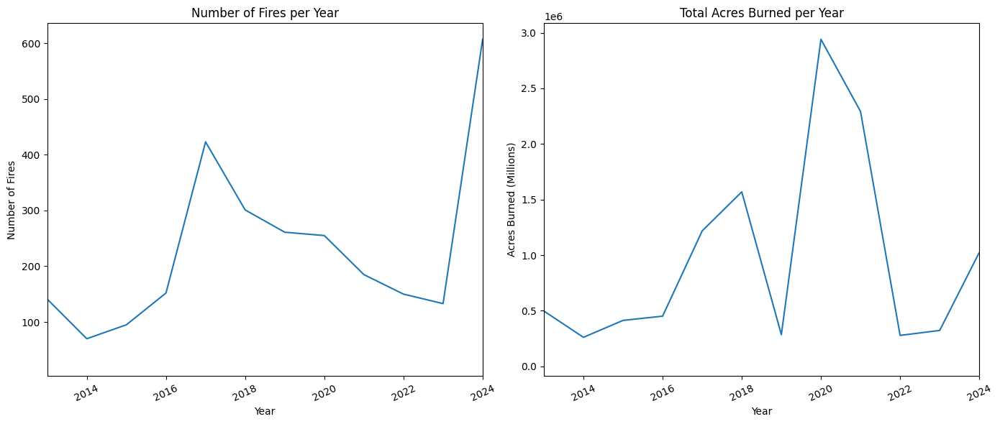

In [8]:
# Plot the number of fires and acres burned per year
count = data.groupby('year')['incident_id'].count() \
            .reset_index() # Reset the index to make it easier to graph
count = count[count['year'] >= 2013]

# Create plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].plot(count['year'], count['incident_id'])
axes[0].set_title("Number of Fires per Year")
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Number of Fires")
axes[0].set_xlim([2013, 2024])
axes[0].tick_params(axis='x', rotation=25)

acres = data.groupby('year')['incident_acres_burned'].sum() \
            .reset_index()
acres = acres[acres['year'] >= 2013]

axes[1].plot(acres['year'], acres['incident_acres_burned'])
axes[1].set_title("Total Acres Burned per Year")
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Acres Burned (Millions)")
axes[1].set_xlim([2013, 2024])
axes[1].tick_params(axis='x', rotation=25)

plt.tight_layout()
plt.show()

Text(0.5, 0, 'Number of Fires')

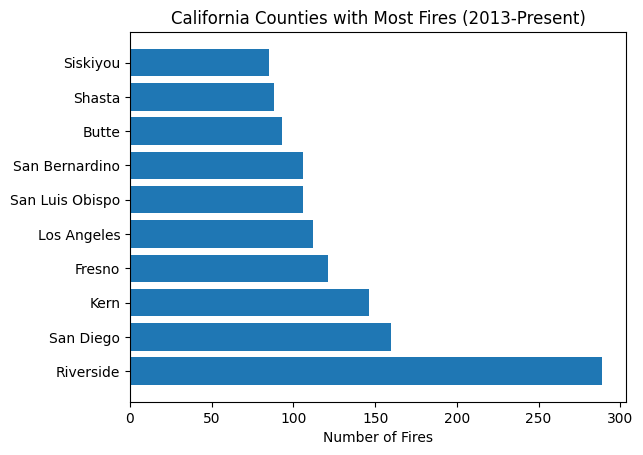

In [9]:
# Create bar chart: top 10 counties that experienced the most fires
counties = data.groupby('incident_county')['incident_id'].count() \
                .reset_index() \
                .sort_values(by='incident_id', ascending=False) \
                .head(10)

plt.barh(y=counties['incident_county'], width=counties['incident_id'])
plt.title("California Counties with Most Fires (2013-Present)")
plt.xlabel("Number of Fires")

#### Challenge: What are the top 5 administrative units that have had the most total area burned (not just the most fires)?

> The administrative unit column is `incident_administrative_unit` and burned area column is `incident_acres_burned`

Hint: Look at the above code block; how can we get the sum of the acres burned instead of just the count of the ids?

In [ ]:
# Write code here


##### Open for Answer
Here is one way to answer this question - your solution may look different!

Text(0.5, 0, 'Total Acres Burned')

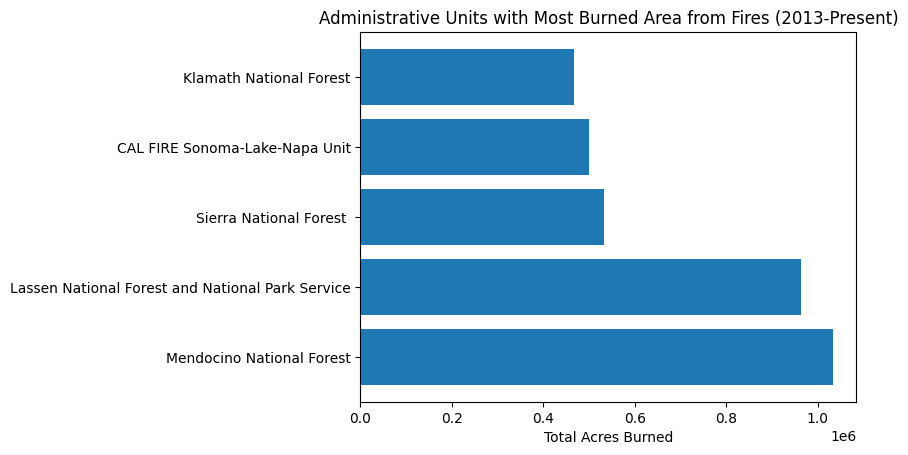

In [10]:
# Get the top 5 administrative units with highest burned area from fires
units = data.groupby('incident_administrative_unit')['incident_acres_burned'].sum() \
                .reset_index() \
                .sort_values(by='incident_acres_burned', ascending=False) \
                .head(5)

plt.barh(y=units['incident_administrative_unit'], width=units['incident_acres_burned'])
plt.title("Administrative Units with Most Burned Area from Fires (2013-Present)")
plt.xlabel("Total Acres Burned")

### 2. Interactively Map the Fires

In [11]:
# Map the fires interactively
data.explore(column="incident_acres_burned",
             tooltip=["incident_name", "incident_dateonly_extinguished"],
             tooltip_kwds=dict(labels=False),
             popup=True,
             tiles="OpenStreetMap",
             cmap="YlOrRd_r",
             marker_kwds=dict(radius=5, fill=True),
             vmin=0,
             vmax=1000
)

#### Challenge: Make the same interactive map above, but for only one year (you can choose any year from 2013 to 2025)
If you have time, try to change the radius of the points or the cmap (color schemes). See a [list of available colors here](https://matplotlib.org/stable/gallery/color/colormap_reference.html).

In [ ]:
# Write your code below

data_filtered =

# Write your code above

data_filtered.explore(column="incident_acres_burned",
             tooltip=["incident_name", "incident_dateonly_extinguished"],
             tooltip_kwds=dict(labels=False),
             popup=True,
             tiles="OpenStreetMap",
             cmap="YlOrRd_r",
             marker_kwds=dict(radius=5, fill=True),
             vmin=0,
             vmax=1000
)

##### Open for Answer

In [12]:
# Filter the data to just show 2024 fires

data_filtered = data[data['year'] == 2024]

# Map the 2024 fires

data_filtered.explore(column="incident_acres_burned",
             tooltip=["incident_name", "incident_dateonly_extinguished"],
             tooltip_kwds=dict(labels=False),
             popup=True,
             tiles="OpenStreetMap",
             cmap="YlOrRd_r",
             marker_kwds=dict(radius=5, fill=True),
             vmin=0,
             vmax=1000
)

### 3. Map the Fires Statically

Text(0.5, 1.0, 'California Wildfires (2013-Present)')

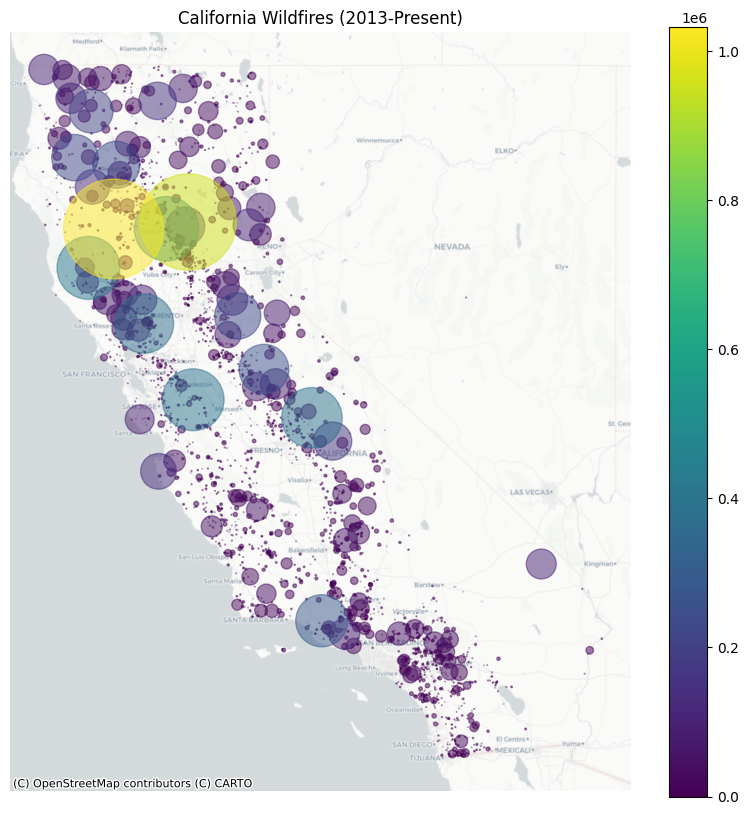

In [13]:
# Map the fires, with the size of the point based on acres burned
fig, ax = plt.subplots(figsize=(10, 10))

data.plot(ax=ax, column="incident_acres_burned",
               markersize=data['incident_acres_burned'] * 0.005,
               legend=True, alpha=0.5)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, crs=data.crs)
ax.set_axis_off()
ax.set_title("California Wildfires (2013-Present)")

### 4. View Before & After of Fires with Satellite Imagery

We will use the Planetary Computer STAC API to search for satellite imagery and then use rasterio to display the data - without needing to download anything! [Learn more here](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a#Example-Notebook).

#### Setup: Load Satellite Imagery

In [14]:
def square_poly(longitude, latitude, distance):
  """
  Inputs: longitude and latitude (EPSG:4326) and distance (meters)
  Output: square polygon that is centered at the input coordinates
  """
  gs = gpd.GeoSeries(wkt.loads(f'POINT ({longitude} {latitude})'))
  gdf = gpd.GeoDataFrame(geometry=gs)
  gdf.crs='EPSG:4326'
  gdf = gdf.to_crs('EPSG:32617')
  res = gdf.buffer(
      distance=distance,
      cap_style='square',
  )
  return res.to_crs('EPSG:4326').iloc[0]

In [15]:
# Connect to Planetary Computer
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

def get_satellite_data(fire_name, buffer_distance, buffer_days):
  """
  Search Planetary Computer for Sentinel-2 satellite imagery from before and
  after the fire.
  Inputs:
  - fire_name (str): the name of the fire (matching the CAL FIRE dataset)
  - buffer_distance (int): distance (meters) around the recorded fire point to crop the satellite image
  - buffer_days (int): length (days) before and after the fire record date to search for satellite images
  Output:
  - before_asset_href and after_asset_href: URL to the Cloud Optimized GeoTIFF before and after the fire, respectively
  - area_of_interest: the buffer distance around the fire point (helpful for displaying the image)
  """
  # Get fire data (if there are multiple fires with same name, get most recent one)
  fire_data = data[data['incident_name'] == fire_name].sort_values(by='incident_date_created', ascending=False).iloc[0]
  fire_lon = fire_data['incident_longitude']
  fire_lat = fire_data['incident_latitude']

  # Get fire date and use it to define a time range
  fire_date = fire_data['incident_dateonly_created'].date()
  search_start = str(fire_date - timedelta(days = buffer_days))
  search_end = str(fire_date + timedelta(days = buffer_days))
  fire_date = str(fire_date)
  print(f"{fire_name} record created on {fire_date}. Searching satellite images from {search_start} to {search_end}")

  # Define time ranges; we will search for satellite images taken between these dates
  before_fire = f"{search_start}/{fire_date}"
  after_fire = f"{fire_date}/{search_end}"

  area_of_interest = {
      "type": "Polygon",
      "coordinates": [
          [list(coord) for coord in square_poly(fire_lon, fire_lat, buffer_distance).exterior.coords]
      ],
  }

  ##### Before fire #####
  search = catalog.search(
      collections=["sentinel-2-l2a"],
      intersects=area_of_interest,
      datetime=before_fire,
      query={"eo:cloud_cover": {"lt": 10}},
  )

  # Check how many images were returned
  items = search.item_collection()
  print(f"Before fire: Returned {len(items)} satellite images")

  # Get least cloudy image
  least_cloudy_item = min(items, key=lambda item: eo.ext(item).cloud_cover)

  print(
      f"Choosing {least_cloudy_item.id} from {least_cloudy_item.datetime.date()}"
      f" with {eo.ext(least_cloudy_item).cloud_cover}% cloud cover"
  )
  before_asset_href = least_cloudy_item.assets["visual"].href

  ##### After fire #####
  search = catalog.search(
      collections=["sentinel-2-l2a"],
      intersects=area_of_interest,
      datetime=after_fire,
      query={"eo:cloud_cover": {"lt": 10}},
  )

  # Check how many images were returned
  items = search.item_collection()
  print(f"After fire: Returned {len(items)} satellite images")

  # Get least cloudy image
  least_cloudy_item = min(items, key=lambda item: eo.ext(item).cloud_cover)

  print(
      f"Choosing {least_cloudy_item.id} from {least_cloudy_item.datetime.date()}"
      f" with {eo.ext(least_cloudy_item).cloud_cover}% cloud cover"
  )
  after_asset_href = least_cloudy_item.assets["visual"].href

  return before_asset_href, after_asset_href, area_of_interest

def read_satellite_data(asset_href, area_of_interest):
  """
  Inputs:
  - asset_href: URL to Cloud Optimized GeoTIFF
  - area_of_interest: polygon corresponding to asset_href
  Output: image
  """
  with rasterio.open(asset_href) as ds:
    aoi_bounds = features.bounds(area_of_interest)
    warped_aoi_bounds = warp.transform_bounds("epsg:4326", ds.crs, *aoi_bounds)
    aoi_window = windows.from_bounds(transform=ds.transform, *warped_aoi_bounds)
    band_data = ds.read(window=aoi_window)

  img = Image.fromarray(np.transpose(band_data, axes=[1, 2, 0]))
  w = img.size[0]
  h = img.size[1]
  aspect = w / h
  target_w = 800
  target_h = (int)(target_w / aspect)
  img.resize((target_w, target_h), Image.Resampling.BILINEAR)
  return img

def plot_fire_impact(fire_name, buffer_distance, buffer_days):
  """
  Combining the get_satellite_data and read_satellite_data functions,
  this function gets the data and displays the before and after satellite images.
  """
  before_asset_href, after_asset_href, area_of_interest = get_satellite_data(fire_name, buffer_distance, buffer_days)

  before_s2 = read_satellite_data(before_asset_href, area_of_interest)
  after_s2 = read_satellite_data(after_asset_href, area_of_interest)

  # Create figure
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))

  axes[0].imshow(before_s2)
  axes[0].axis('off')
  axes[0].set_title(f'Before {fire_name}')

  axes[1].imshow(after_s2)
  axes[1].axis('off')
  axes[1].set_title(f'After {fire_name}')

  plt.tight_layout()
  plt.show()

#### Visualize Satellite Images

Rosa Fire record created on 2025-01-29. Searching satellite images from 2024-12-30 to 2025-02-28
Before fire: Returned 8 satellite images
Choosing S2B_MSIL2A_20250110T184649_R070_T11SKV_20250110T223204 from 2025-01-10 with 0.001493% cloud cover
After fire: Returned 1 satellite images
Choosing S2B_MSIL2A_20250130T184529_R070_T11SKV_20250130T234441 from 2025-01-30 with 3.882685% cloud cover


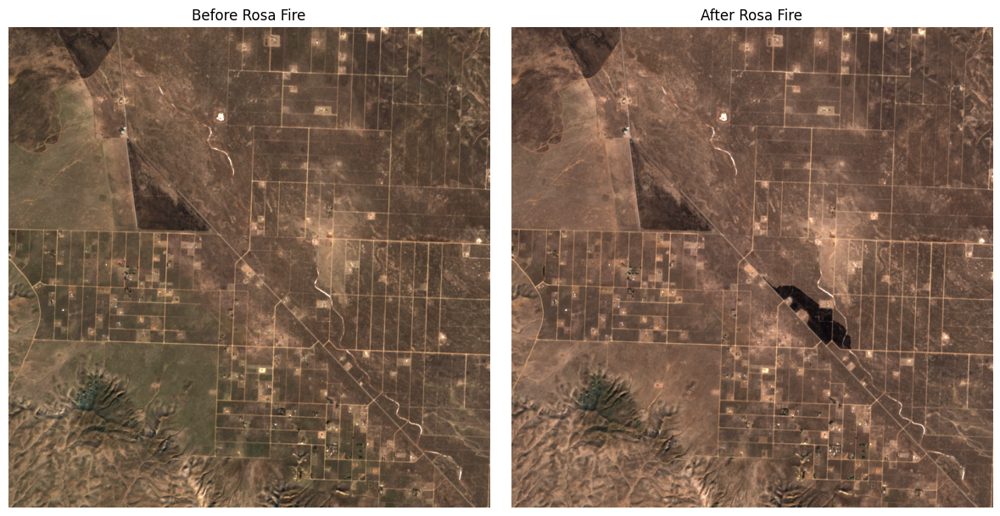

In [16]:
plot_fire_impact('Rosa Fire', 3000, 30)

Border 2 Fire record created on 2025-01-23. Searching satellite images from 2024-12-24 to 2025-02-22
Before fire: Returned 7 satellite images
Choosing S2A_MSIL2A_20250102T183751_R027_T11SNS_20250102T221646 from 2025-01-02 with 0.027034% cloud cover
After fire: Returned 2 satellite images
Choosing S2C_MSIL2A_20250221T183421_R027_T11SNS_20250222T001111 from 2025-02-21 with 0.001462% cloud cover


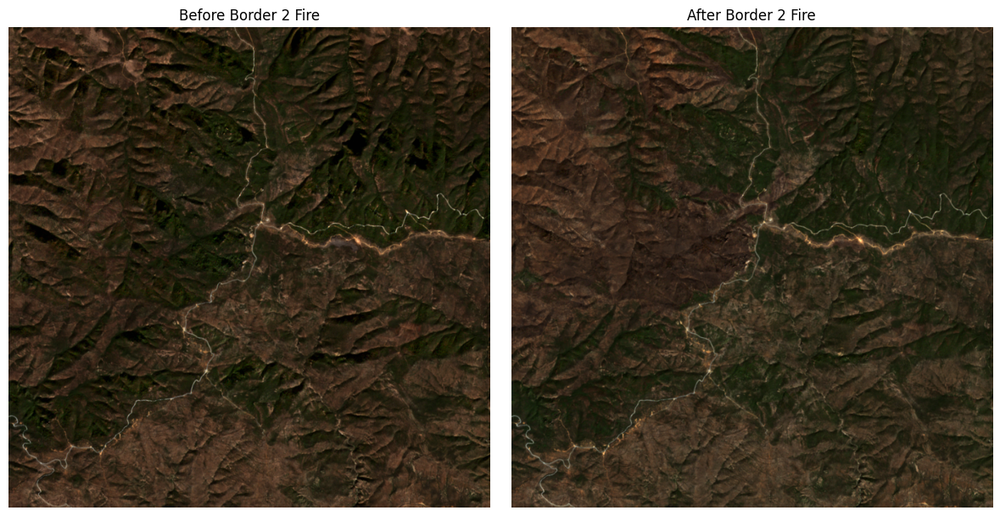

In [17]:
plot_fire_impact('Border 2 Fire', 3000, 30)

Franklin Fire record created on 2024-12-09. Searching satellite images from 2024-11-09 to 2025-01-08
Before fire: Returned 3 satellite images
Choosing S2A_MSIL2A_20241113T183621_R027_T11SLT_20241113T223000 from 2024-11-13 with 0.005869% cloud cover
After fire: Returned 2 satellite images
Choosing S2B_MSIL2A_20241218T183709_R027_T11SLT_20241218T222347 from 2024-12-18 with 0.004997% cloud cover


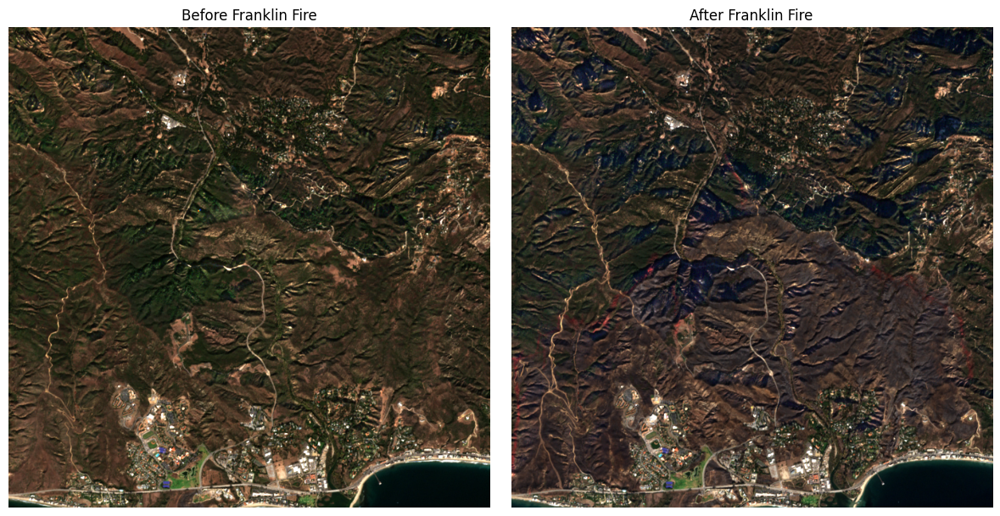

In [18]:
plot_fire_impact('Franklin Fire', 3000, 30)

#### Challenge: Display the satellite images for another fire
You can experiment with different buffer distances (meters) and days!

In [ ]:
plot_fire_impact("FIRE NAME", buffer_distance = NUMBER, buffer_days = NUMBER)

##### Hint: How you can find the name of a fire

In [23]:
# List the 10 most recent fires where the acres burned was more than 1000
data[data['incident_acres_burned'] > 1000].sort_values(by='incident_date_created', ascending=False)[['incident_name', 'incident_date_created', 'incident_acres_burned']].head(10)

,incident_name,incident_date_created,incident_acres_burned
2831,Border 2 Fire,2025-01-23 13:58:00+00:00,6625.0
2828,Hughes Fire,2025-01-22 10:53:02+00:00,10425.0
2817,Kenneth Fire,2025-01-09 15:34:13+00:00,1052.0
2810,Eaton Fire,2025-01-07 18:18:00+00:00,14021.0
2809,Palisades Fire,2025-01-07 10:30:00+00:00,23707.0
2802,Franklin Fire,2024-12-09 22:50:53+00:00,4037.0
2775,Mountain Fire,2024-11-06 08:51:00+00:00,19904.0
2780,Horseshoe Fire,2024-10-30 11:27:05+00:00,4537.0
2748,Shoe Fire,2024-10-09 13:18:46+00:00,5124.0
2703,Airport Fire,2024-09-09 13:21:00+00:00,23526.0


##### What to do if you get an error

In [24]:
plot_fire_impact('Franklin Fire', 3000, 2)

Franklin Fire record created on 2024-12-09. Searching satellite images from 2024-12-07 to 2024-12-11
Before fire: Returned 0 satellite images


ValueError: min() arg is an empty sequence

If you get an error like above, this means that no satellite images were found for the provided inputs. Likely, it is because the `buffer_days` is too small. There were no cloudless satellite images from the set number of days before and after the date of the fire.
> Solution: You can increase the `buffer_days` when this happens.